In [91]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
import numpy as np
import argparse

In [92]:
tf.__version__

'1.15.0'

In [93]:
!ls ../SummitDemo2019/data/data/dynatrace/

1304_8972.jpg	      pic_053.jpg  pic_140.jpg	pic_270.jpg
1306_8972.jpg	      pic_059.jpg  pic_144.jpg	pic_271.jpg
2019Summit-1477.jpg   pic_067.jpg  pic_146.jpg	pic_282.jpg
2019Summit-1479.jpg   pic_070.jpg  pic_150.jpg	pic_309.jpg
2019Summit_-4609.jpg  pic_072.jpg  pic_155.jpg	pic_314.jpg
2019Summit_-4610.jpg  pic_073.jpg  pic_158.jpg	pic_315.jpg
2019Summit_-4612.jpg  pic_079.jpg  pic_164.jpg	pic_321.jpg
DSC_6671.jpg	      pic_083.jpg  pic_166.jpg	pic_322.jpg
DSC_6673.jpg	      pic_086.jpg  pic_171.jpg	pic_323.jpg
DSC_6675.jpg	      pic_088.jpg  pic_176.jpg	pic_337.jpg
DSC_6677.jpg	      pic_090.jpg  pic_181.jpg	pic_350.jpg
DSC_6681.jpg	      pic_093.jpg  pic_185.jpg	pic_355.jpg
DSC_6684.jpg	      pic_095.jpg  pic_206.jpg	pic_371.jpg
models		      pic_098.jpg  pic_209.jpg	pic_383.jpg
pic_015.jpg	      pic_108.jpg  pic_210.jpg	pic_392.jpg
pic_016.jpg	      pic_110.jpg  pic_218.jpg	pic_395.jpg
pic_019.jpg	      pic_112.jpg  pic_225.jpg	Summit2019-2008.jpg
pic_026.jpg	      pic_113.jpg  

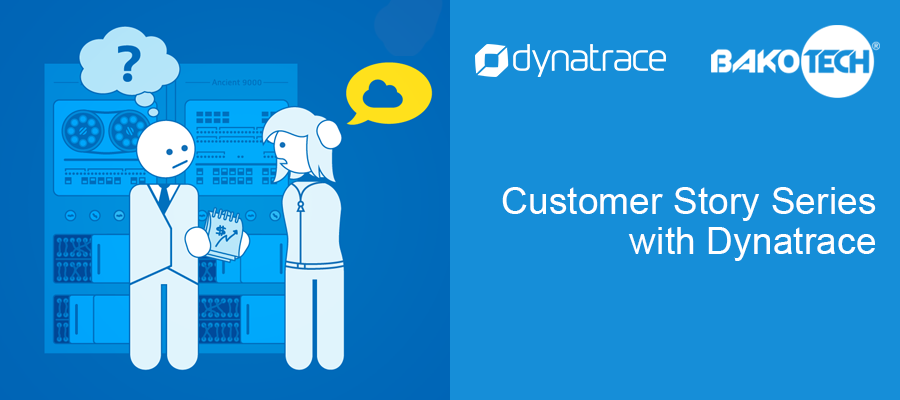

In [94]:
imagepath="../SummitDemo2019/data/data/dynatrace/pic_113.jpg"
from IPython.display import Image
Image(filename=imagepath) 

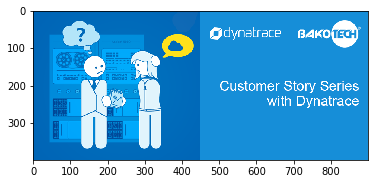

In [95]:
from matplotlib.pyplot import imshow
import numpy as np
from PIL import Image

%matplotlib inline
image = Image.open(imagepath, 'r')
imshow(np.asarray(image))

In [96]:
image = img_to_array(image)
image = np.expand_dims(image, axis=0)
# rotation_range +-30
# shifts 0.1 10% shift
# shear 0.2 radians 
# zoom  uniform distribution
# Don't flip horizontally
aug = ImageDataGenerator(rotation_range=30, 
                         width_shift_range=0.1, height_shift_range=0.1,
                         shear_range=0.2, 
                         zoom_range=0.2,
                         horizontal_flip=False, 
                         fill_mode="nearest")

imageGen = aug.flow(image, batch_size=1, 
                    save_to_dir="./data",
                    save_prefix="new_", 
                    save_format="jpg")

In [97]:
!ls

data  data_augmentation.ipynb  environment.yaml  tf_device_setup.ipynb


In [98]:
total=0
for image in imageGen:
    total += 1
    if total == 10:
        break

In [99]:
#!ls ./data
# get absolute paths
import os
f = []
directory="./data"

def absoluteFilePaths(directory):
    for dirpath,_,filenames in os.walk(directory):
        for ifile in filenames:
            ff=os.path.abspath(os.path.join(dirpath, ifile))
            f.append(ff)

absoluteFilePaths(directory)
print(f)

['/home/suku/development/tf_test/data/new__0_4971.jpg', '/home/suku/development/tf_test/data/new__0_5707.jpg', '/home/suku/development/tf_test/data/new__0_9230.jpg', '/home/suku/development/tf_test/data/new__0_6978.jpg', '/home/suku/development/tf_test/data/new__0_3024.jpg', '/home/suku/development/tf_test/data/new__0_3126.jpg', '/home/suku/development/tf_test/data/new__0_9954.jpg', '/home/suku/development/tf_test/data/new__0_9309.jpg', '/home/suku/development/tf_test/data/new__0_7458.jpg', '/home/suku/development/tf_test/data/new__0_8944.jpg', '/home/suku/development/tf_test/data/new__0_2312.jpg', '/home/suku/development/tf_test/data/new__0_6588.jpg', '/home/suku/development/tf_test/data/new__0_8491.jpg', '/home/suku/development/tf_test/data/new__0_9026.jpg', '/home/suku/development/tf_test/data/new__0_9733.jpg', '/home/suku/development/tf_test/data/new__0_4341.jpg', '/home/suku/development/tf_test/data/new__0_3018.jpg', '/home/suku/development/tf_test/data/new__0_1345.jpg', '/home/su

In [100]:
!ls

data  data_augmentation.ipynb  environment.yaml  tf_device_setup.ipynb


In [101]:
# get image array
from IPython.display import Image, display

listOfImageNames = f
ff=[]
from PIL import Image
for imageName in listOfImageNames:
    imagee = Image.open(imageName, 'r')
    ff.append(np.asarray(imagee))
len(ff)

20

In [102]:
# A method to display images in notebooks
import matplotlib.pyplot as plt
import numpy as np

def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()

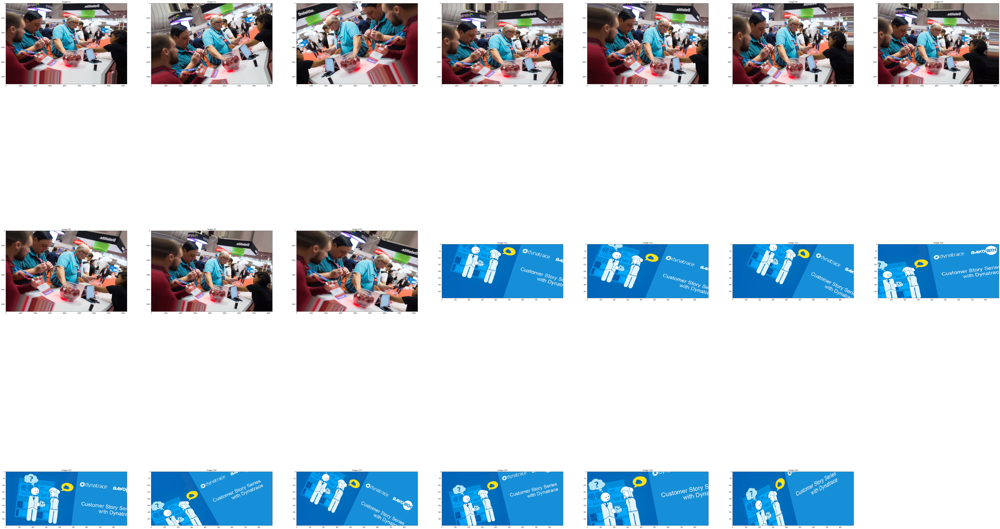

In [103]:
show_images(ff,3)